In [125]:
import cv2 as cv
import numpy as np
import matplotlib.pyplot as plt
import skimage.exposure
plt.rcParams["figure.figsize"] = (10,10)

In [124]:
!pip install scikit-image

     |████████████████████████████████| 12.4 MB 10.6 MB/s eta 0:00:01
     |████████████████████████████████| 25.9 MB 10.5 MB/s eta 0:00:01
     |████████████████████████████████| 3.3 MB 10.4 MB/s eta 0:00:01
     |████████████████████████████████| 4.4 MB 11.3 MB/s eta 0:00:01
     |████████████████████████████████| 1.6 MB 11.3 MB/s eta 0:00:01
     |████████████████████████████████| 148 kB 10.7 MB/s eta 0:00:01
  Attempting uninstall: decorator
    Found existing installation: decorator 5.0.7
    Uninstalling decorator-5.0.7:
      Successfully uninstalled decorator-5.0.7
You should consider upgrading via the '/mnt/d/Biometrics Project/python/venv/bin/python -m pip install --upgrade pip' command.


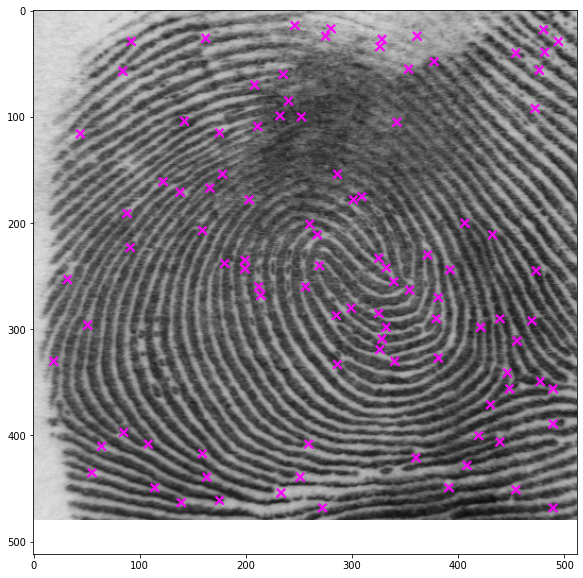

uint8 (512, 512, 3)


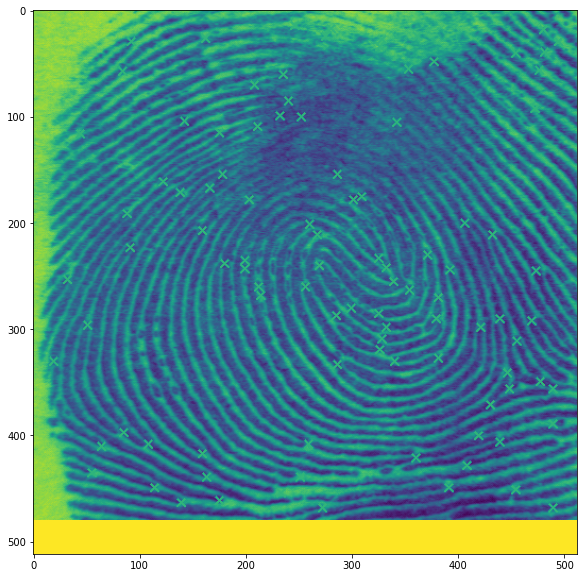

uint8 (512, 512)


In [132]:
src = cv.imread("/mnt/d/Biometrics Project/python/open_fields_examples/f0010_01_min.bmp")
plt.imshow(src)
plt.show()
print(src.dtype, src.shape)
gray_src = cv.imread("/mnt/d/Biometrics Project/python/open_fields_examples/f0010_01_min.bmp", cv.IMREAD_GRAYSCALE)
plt.imshow(gray_src)
plt.show()
print(gray_src.dtype, gray_src.shape)

uint8 (512, 512)


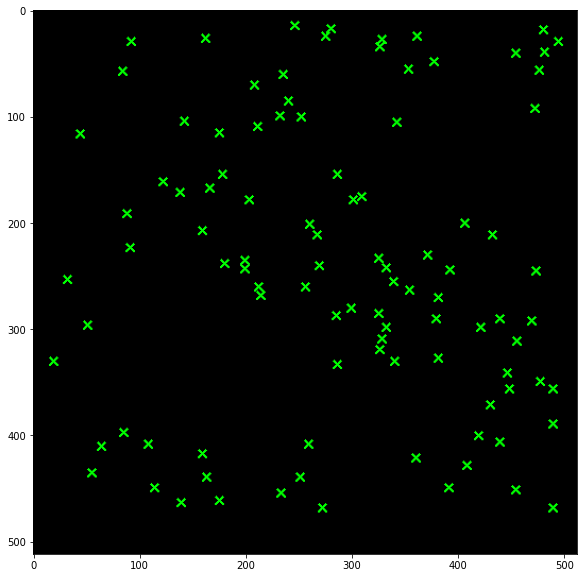

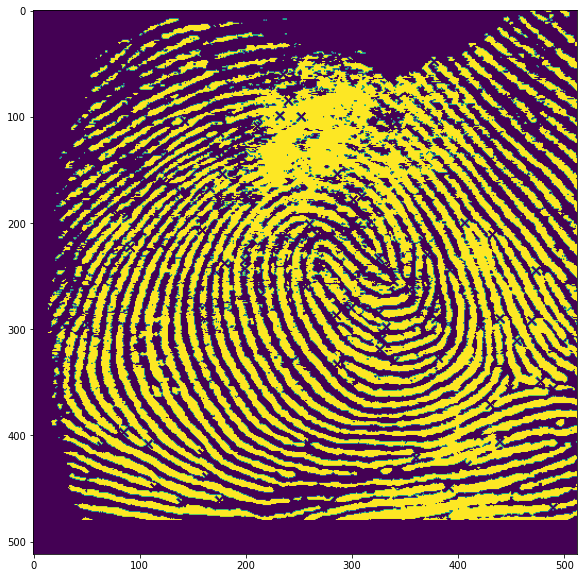

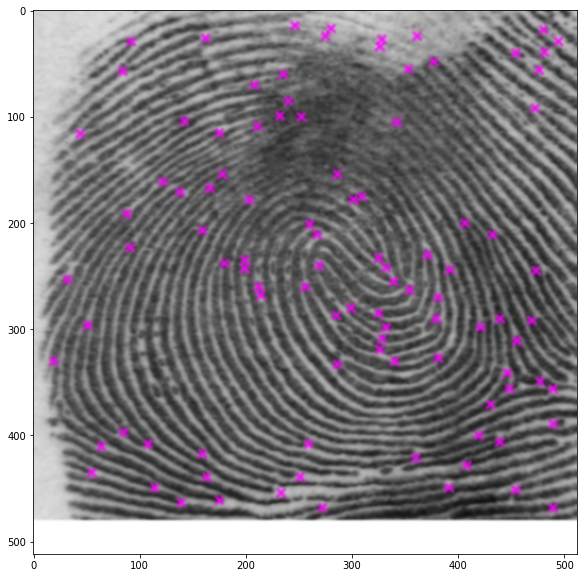

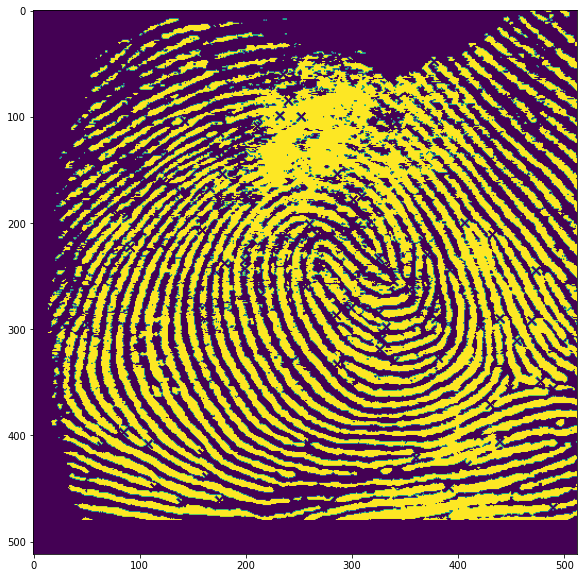

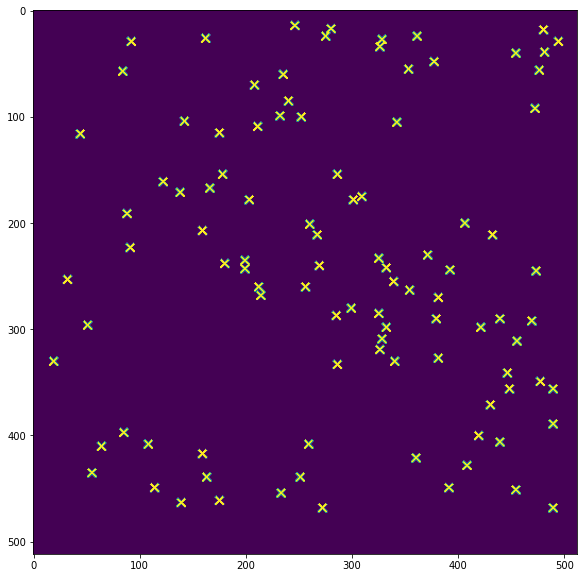

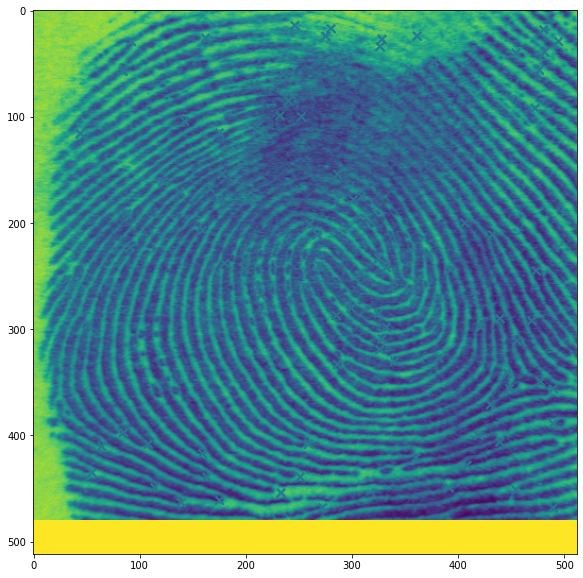

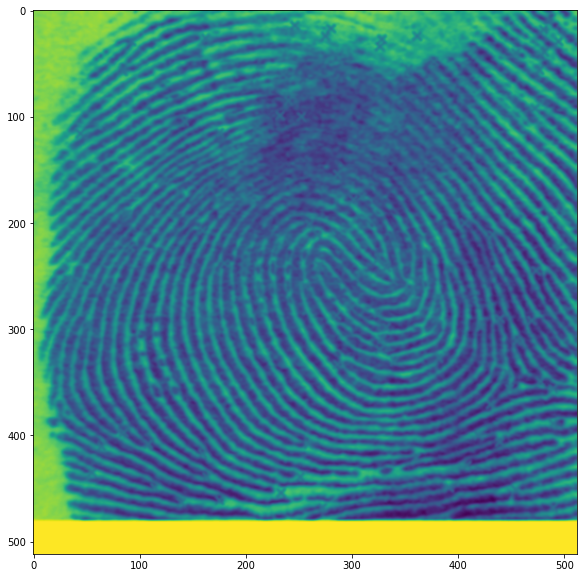

In [134]:
ROI = np.zeros(src.shape, np.uint8)
gray = cv.cvtColor(src, cv.COLOR_RGB2GRAY) 
#gray_img = plt.imshow(gray)
print(gray.dtype, gray.shape)

im_gray = cv.GaussianBlur(src, (5, 5), 0)

#ret, im_th = cv.threshold(im_gray, 90, 255, cv.THRESH_BINARY_INV)
ret, im_th_1 = cv.threshold(src, 0, 255, cv.THRESH_BINARY_INV)
ret, im_th_2 = cv.threshold(gray_src, 90, 255, cv.THRESH_BINARY_INV)
ret, im_th = cv.threshold(gray, 90, 255, cv.THRESH_BINARY_INV)
plt.imshow(im_th_1)
plt.show()
plt.imshow(im_th_2)
plt.show()
plt.imshow(im_gray)
plt.show()
plt.imshow(im_th)
plt.show()
#gray = cv.cvtColor(im_th, cv.COLOR_BGR2GRAY) 
#plt.imshow(gray)
#plt.show()
gray = cv.cvtColor(im_th_1, cv.COLOR_BGR2GRAY) 
plt.imshow(gray)
plt.show()
gray = cv.cvtColor(src, cv.COLOR_BGR2GRAY) 
plt.imshow(gray)
plt.show()
gray = cv.cvtColor(im_gray, cv.COLOR_BGR2GRAY) 
plt.imshow(gray)
plt.show()

(512, 512) uint8


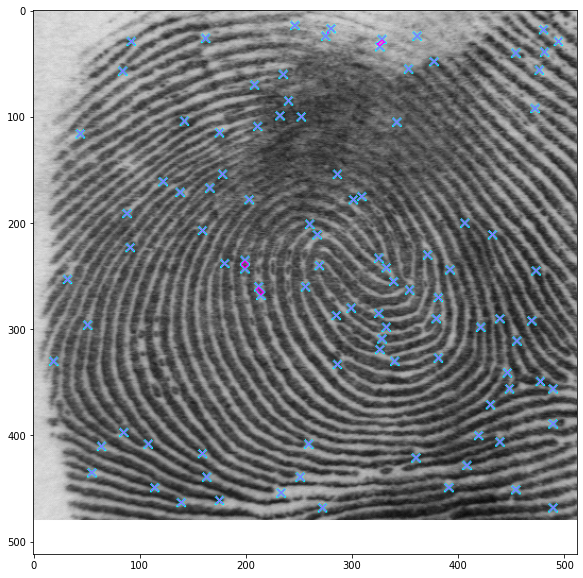

In [97]:
print(im_th_1.shape, im_th_1.dtype)
#im_th_1 = cv.cvtColor(im_th_1, cv.COLOR_RGB2GRAY) 

ctrs, hier = cv.findContours(im_th_1.copy(), cv.RETR_EXTERNAL, cv.CHAIN_APPROX_SIMPLE)
#print(ctrs)
img = cv.drawContours(src.copy(), ctrs, -1, (0,255,255), 1)
plt.imshow(img)
plt.show()

# ctrs, hier = cv.findContours(gray.copy(), cv.RETR_EXTERNAL, cv.CHAIN_APPROX_SIMPLE)
# #print(ctrs)
# img = cv.drawContours(src.copy(), ctrs, -1, (0,255,255), 1)
# plt.imshow(img)
# plt.show()




#image, ctrs, hier = cv.findContours(gray.copy(), cv.RETR_EXTERNAL, cv.CHAIN_APPROX_SIMPLE)
#image, ctrs, hier = cv.findContours(im_th_1.copy(), cv.RETR_EXTERNAL, cv.CHAIN_APPROX_SIMPLE)
#image, ctrs, hier = cv.findContours(im_gray.copy(), cv.RETR_EXTERNAL, cv.CHAIN_APPROX_SIMPLE)
#image, ctrs, hier = cv.findContours(src.copy(), cv.RETR_EXTERNAL, cv.CHAIN_APPROX_SIMPLE)
#image, ctrs, hier = cv.findContours(im_th.copy(), cv.RETR_EXTERNAL, cv.CHAIN_APPROX_SIMPLE)

/mnt/d/Biometrics Project/python/venv/lib/python3.6/site-packages/ipykernel_launcher.py:34: FutureWarning: arrays to stack must be passed as a "sequence" type such as list or tuple. Support for non-sequence iterables such as generators is deprecated as of NumPy 1.16 and will raise an error in the future.


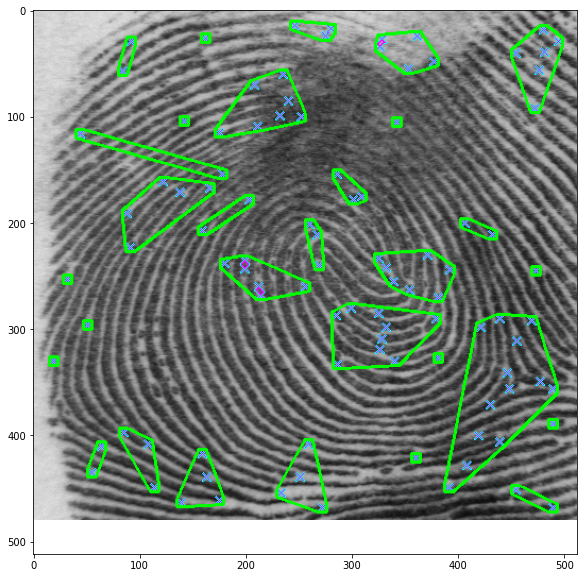

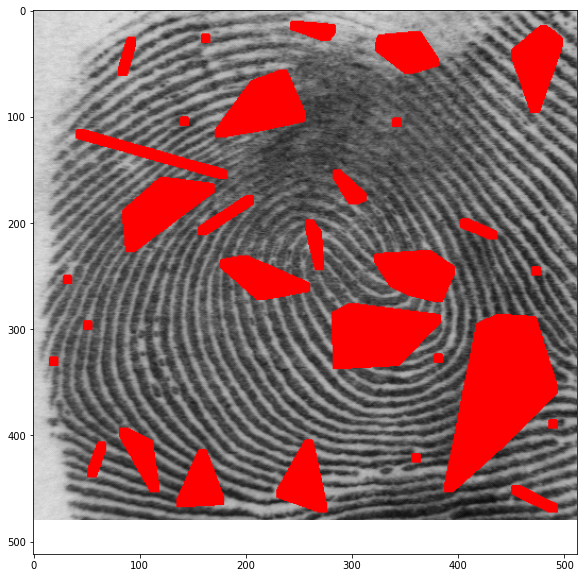

In [120]:
contours = ctrs
def find_if_close(cnt1,cnt2):
    row1,row2 = cnt1.shape[0],cnt2.shape[0]
    for i in range(row1):
        for j in range(row2):
            dist = np.linalg.norm(cnt1[i]-cnt2[j])
            if abs(dist) <= 35 :
                return True
            elif i==row1-1 and j==row2-1:
                return False
            
            
LENGTH = len(ctrs)
status = np.zeros((LENGTH,1))

for i,cnt1 in enumerate(contours):
    x = i    
    if i != LENGTH-1:
        for j,cnt2 in enumerate(contours[i+1:]):
            x = x+1
            dist = find_if_close(cnt1,cnt2)
            if dist == True:
                val = min(status[i],status[x])
                status[x] = status[i] = val
            else:
                if status[x]==status[i]:
                    status[x] = i+1

unified = []
maximum = int(status.max())+1
for i in range(maximum):
    pos = np.where(status==i)[0]
    if pos.size != 0:
        cont = np.vstack(contours[i] for i in pos)
        hull = cv.convexHull(cont)
        unified.append(hull)

img_1 = cv.drawContours(img.copy(),unified,-1,(0,255,0),2)
#img_3 = cv.drawContours(thresh,unified,-1,255,-1)


img_2 = cv.drawContours(src.copy(), unified, -1, 255, -1)
plt.imshow(img_1)
plt.show()
plt.imshow(img_2)
plt.show()




/mnt/d/Biometrics Project/python/venv/lib/python3.6/site-packages/ipykernel_launcher.py:34: FutureWarning: arrays to stack must be passed as a "sequence" type such as list or tuple. Support for non-sequence iterables such as generators is deprecated as of NumPy 1.16 and will raise an error in the future.


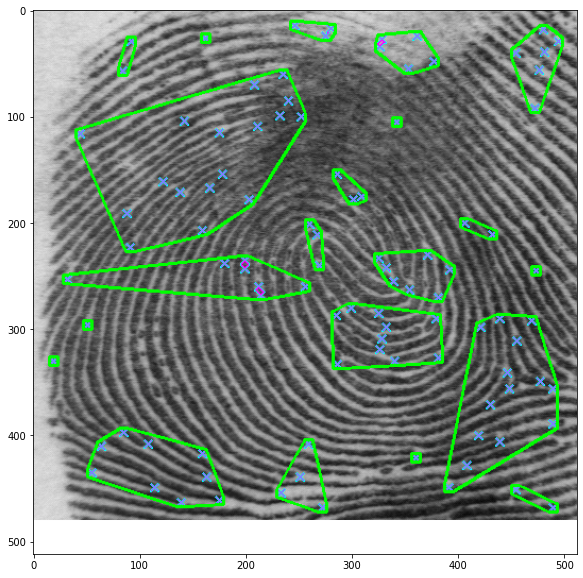

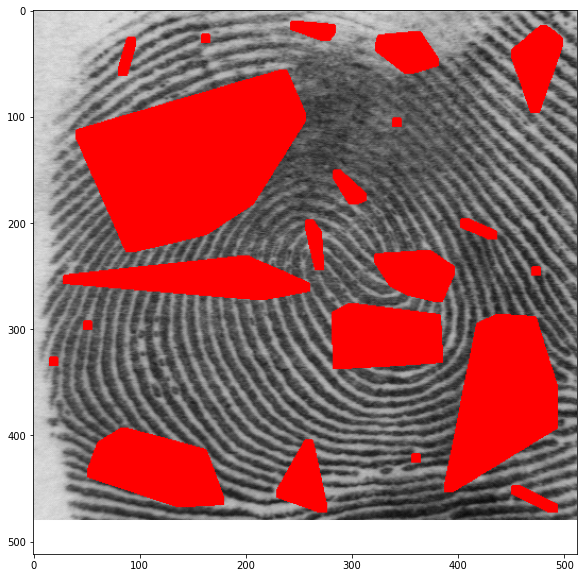

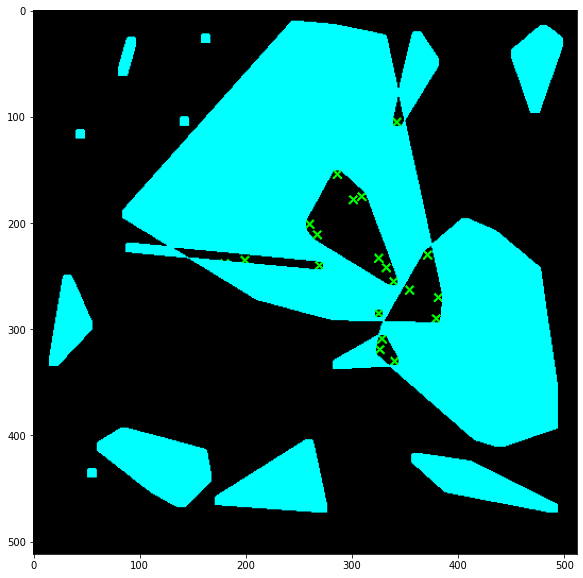

In [117]:
ret, im_g = cv.threshold(img_2, 0, 255, cv.THRESH_BINARY_INV)
plt.imshow(im_g)
plt.show()

30
contour:  0


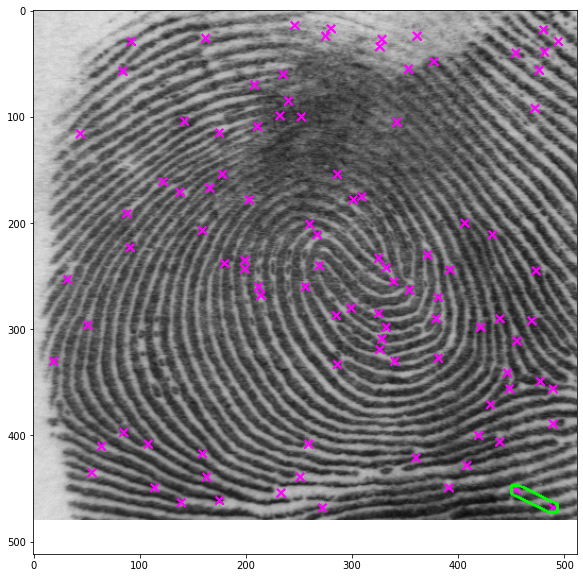

contour:  1


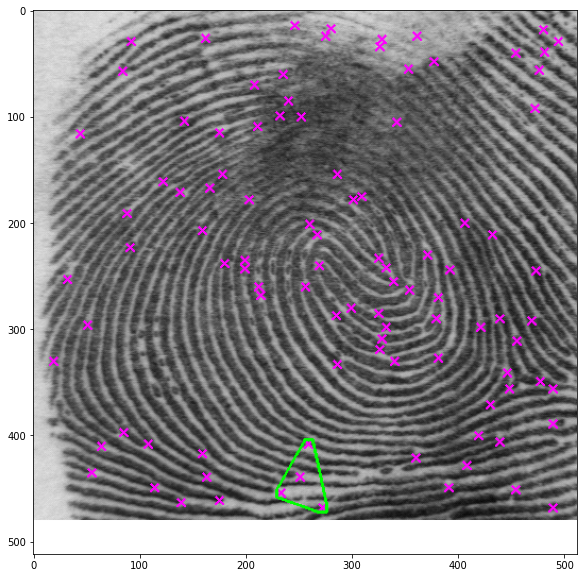

contour:  2


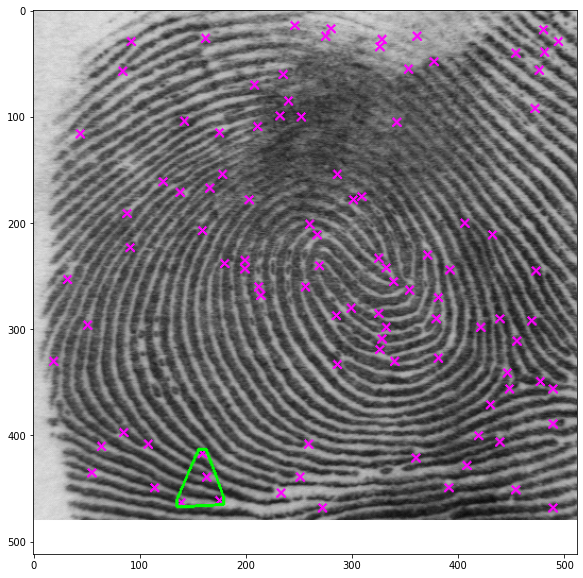

contour:  3


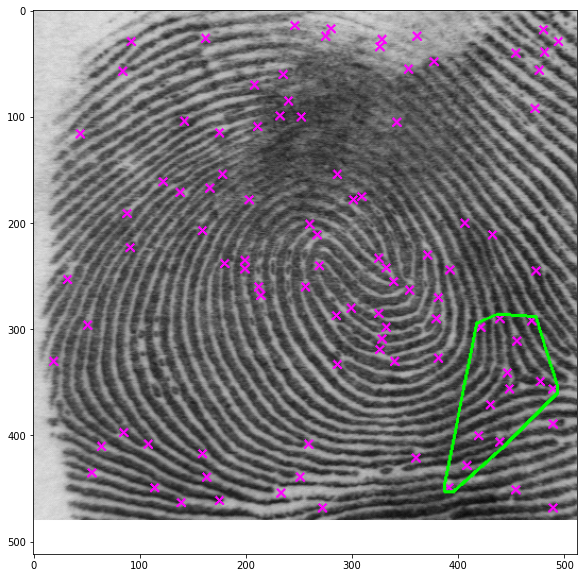

contour:  4


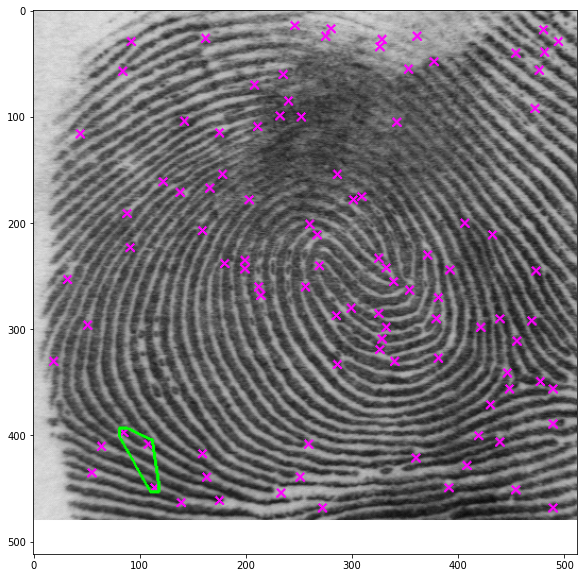

contour:  5


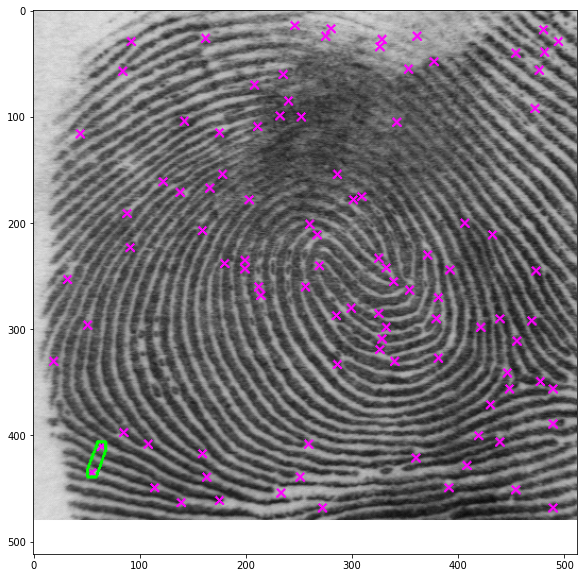

contour:  6


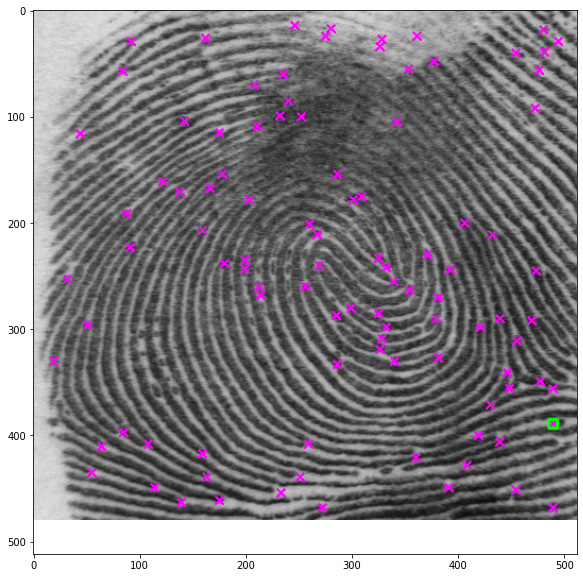

contour:  7


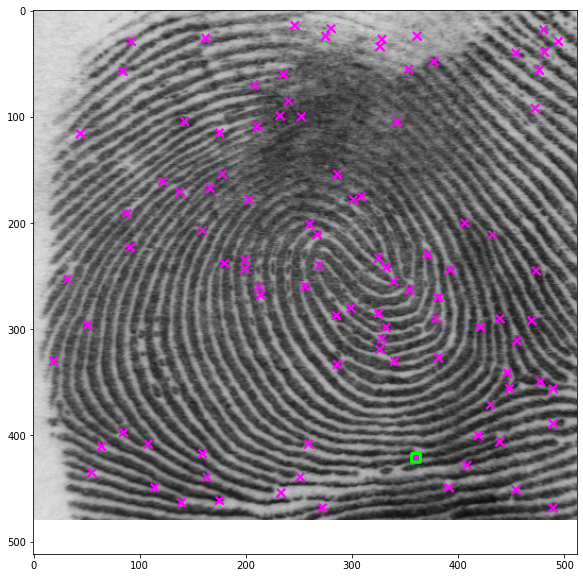

contour:  8


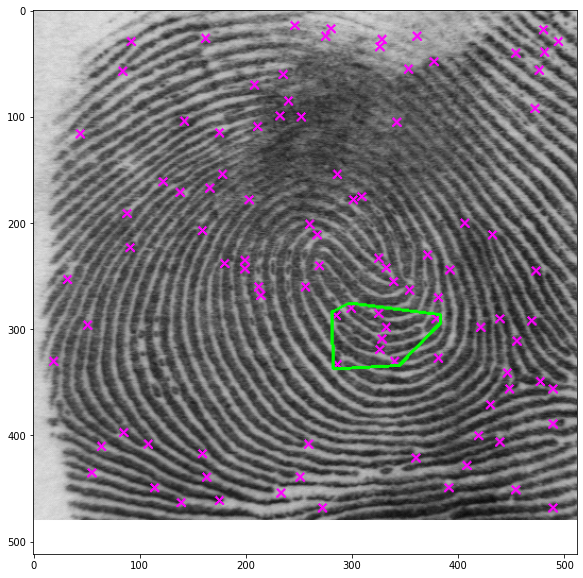

contour:  9


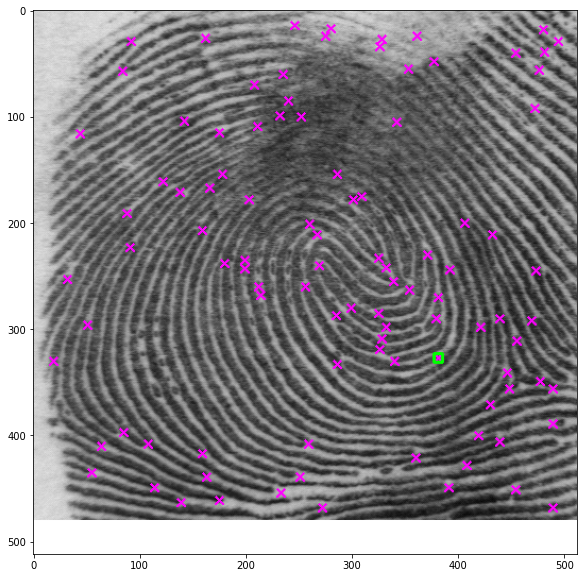

contour:  10


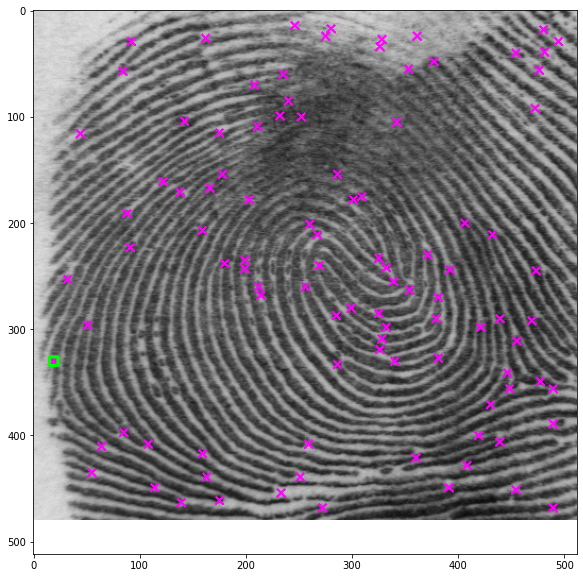

contour:  11


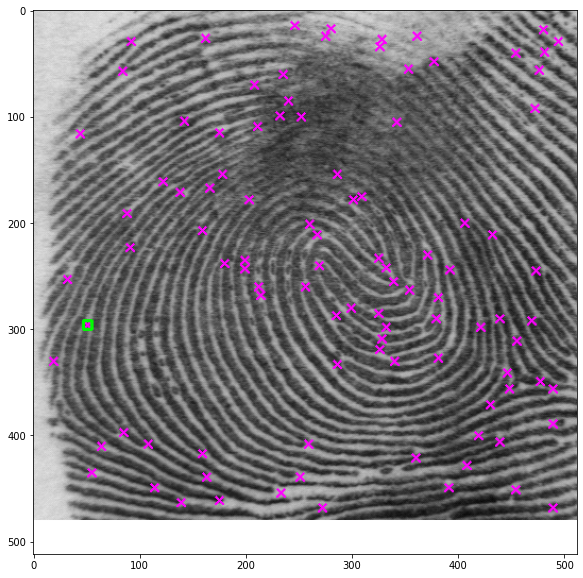

contour:  12


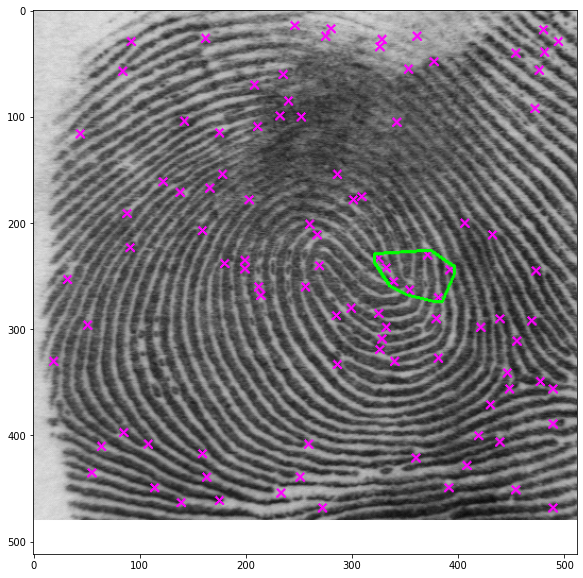

contour:  13


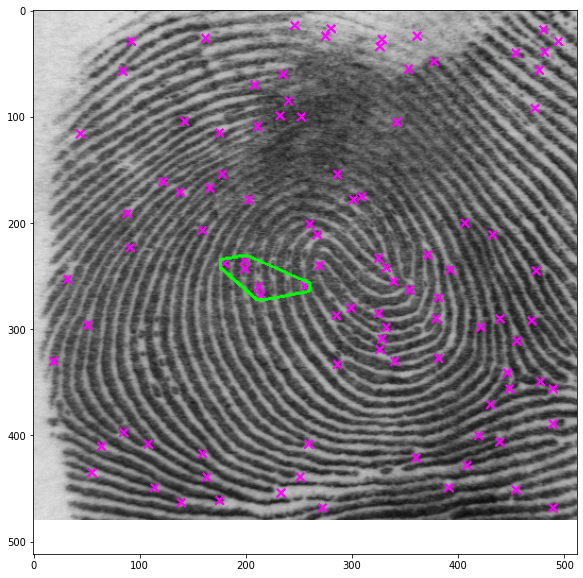

contour:  14


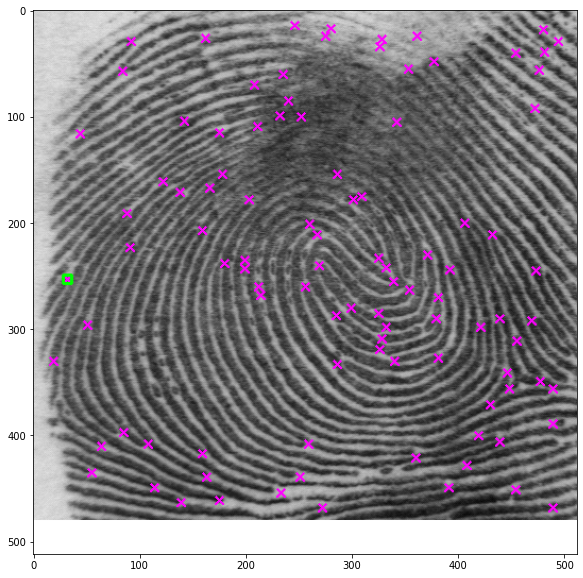

contour:  15


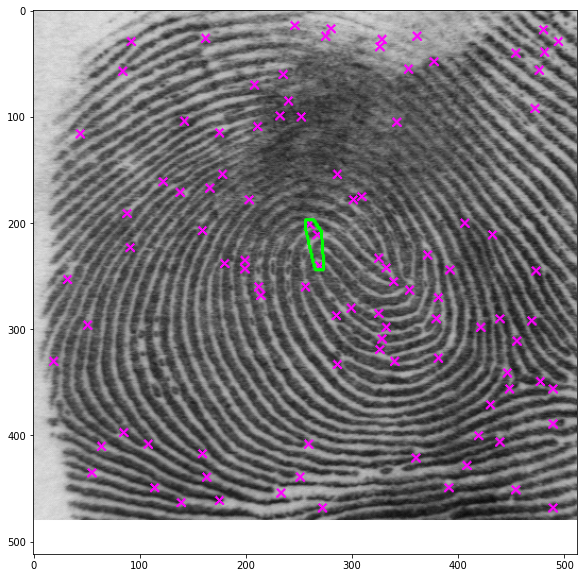

contour:  16


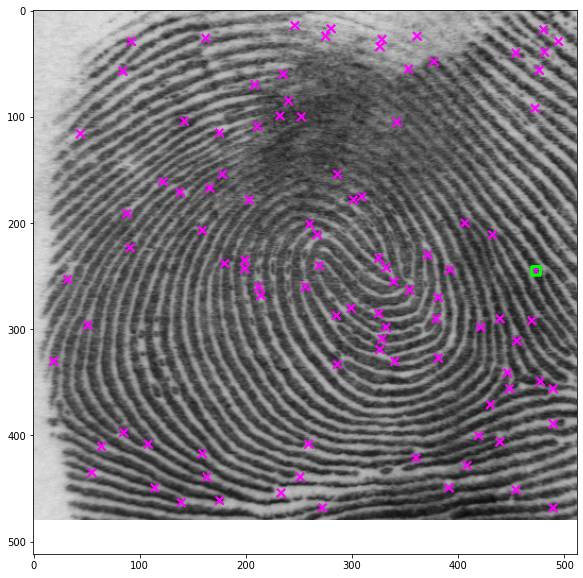

contour:  17


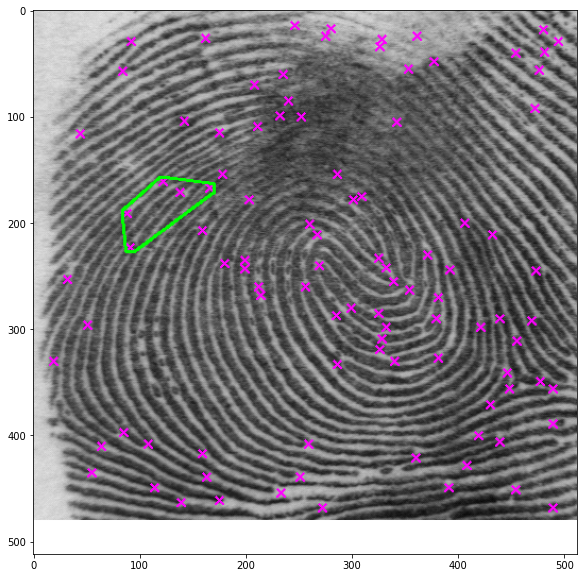

contour:  18


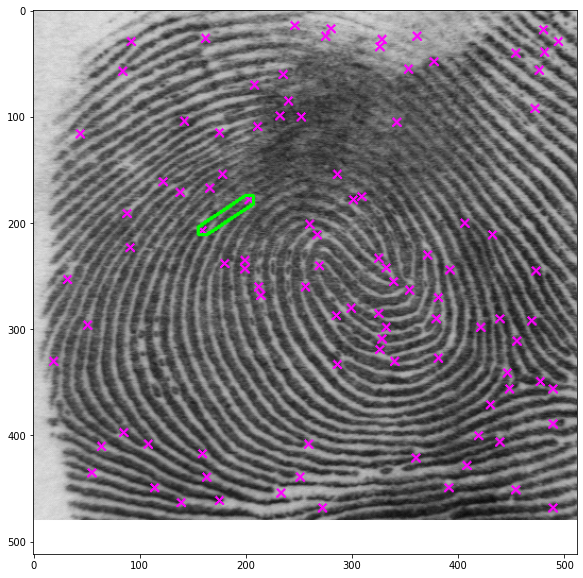

contour:  19


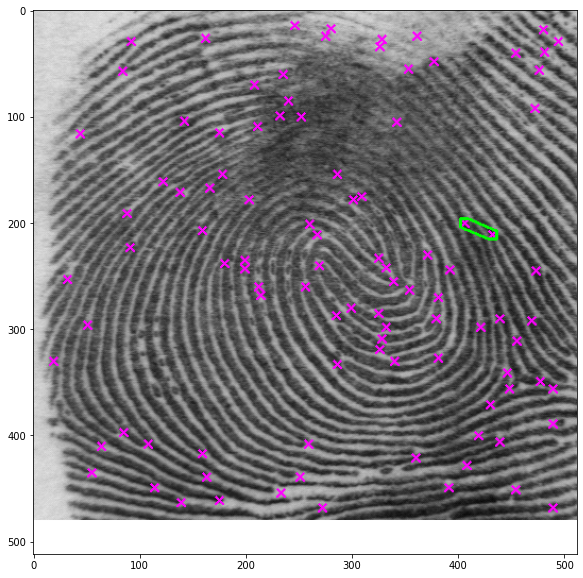

contour:  20


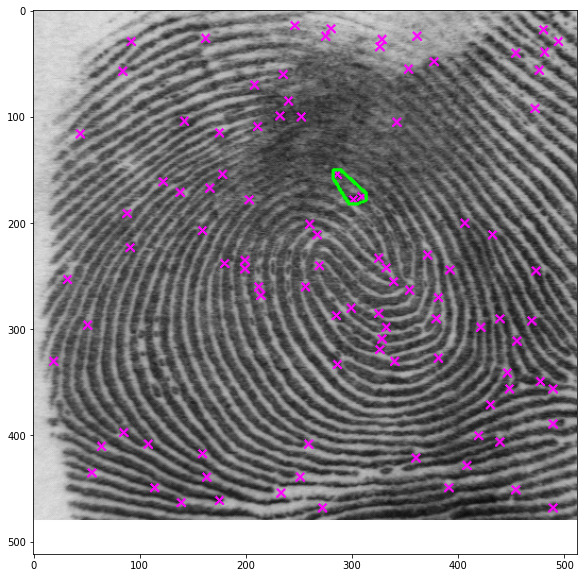

contour:  21


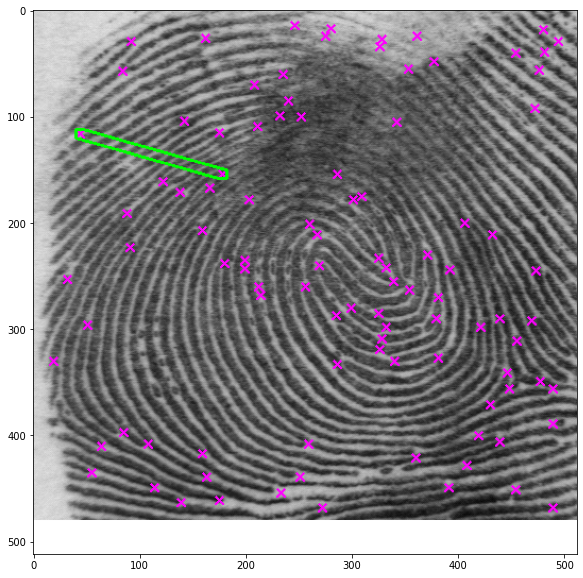

contour:  22


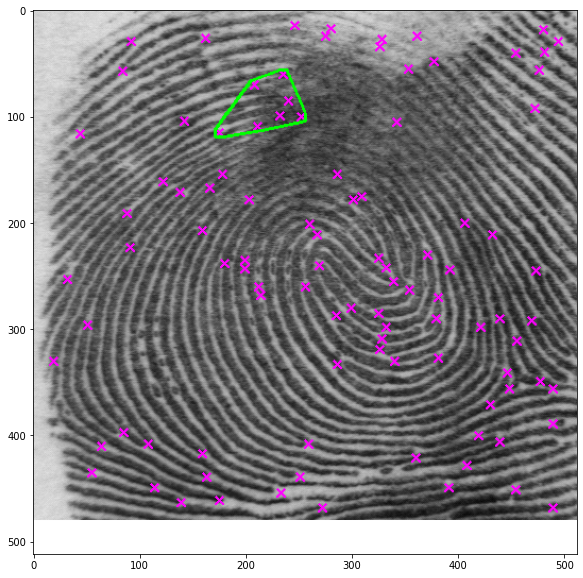

contour:  23


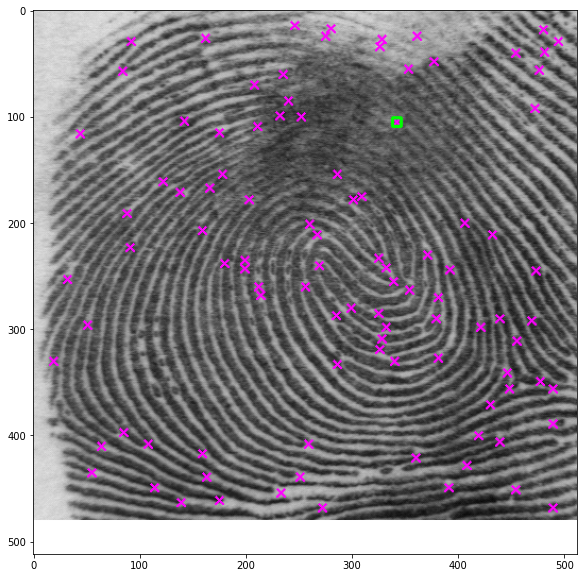

contour:  24


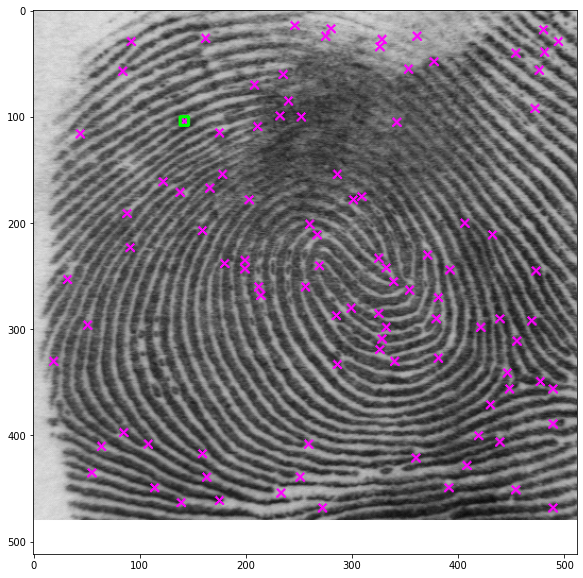

contour:  25


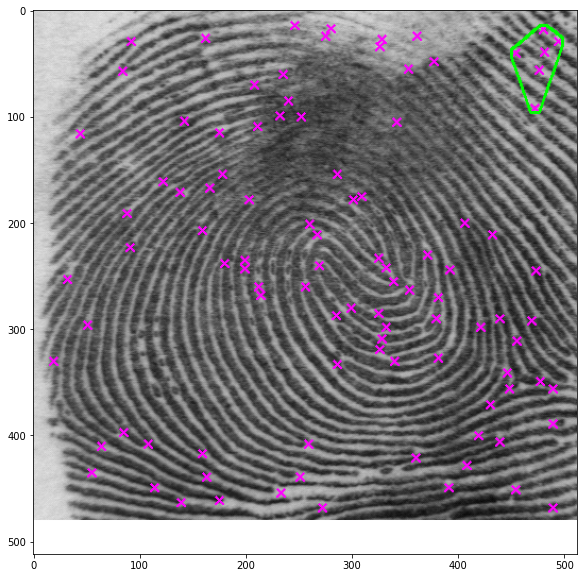

contour:  26


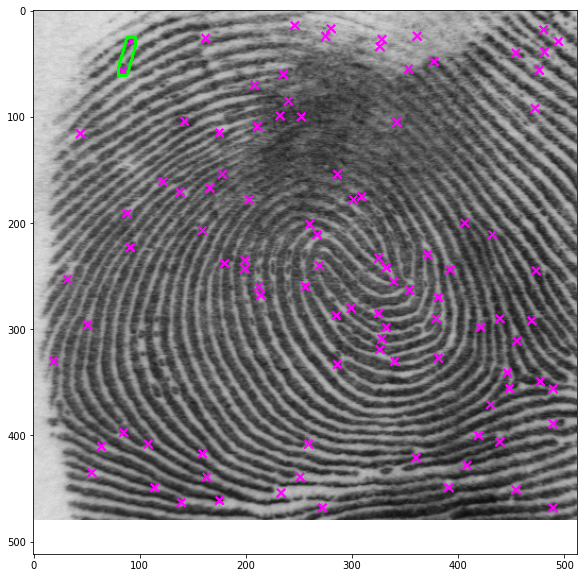

contour:  27


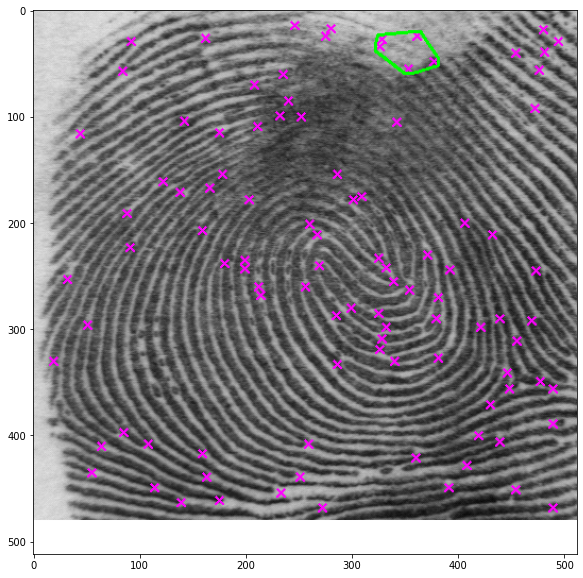

contour:  28


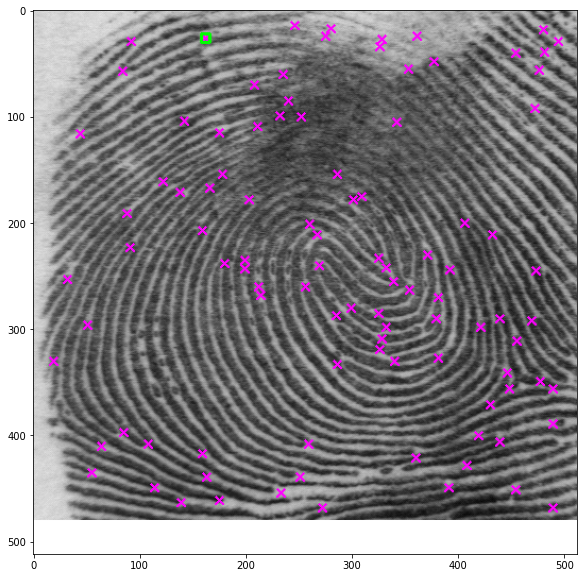

contour:  29


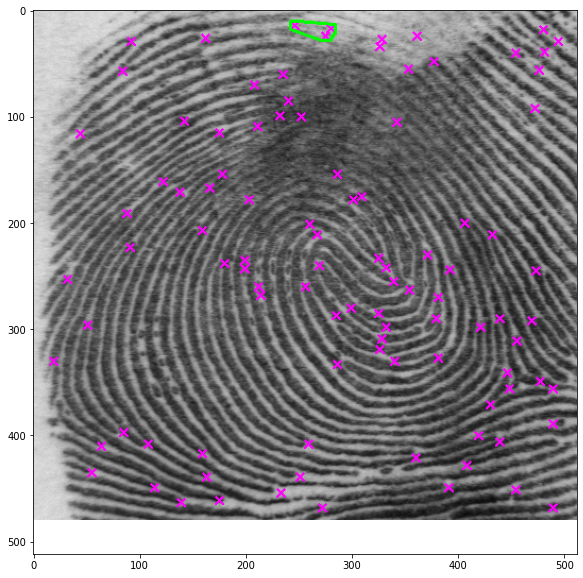

In [114]:
print(len(unified))

for i,v  in enumerate(unified):
    img_1 = cv.drawContours(src.copy(),unified , i,(0,255,0),2)
    print('contour: ', i )
    plt.imshow(img_1)
    plt.show()


center x,y: (138, 322) center radius: 86.7348861694336
(140, 322)  not far from  (138, 322, 86)
(138, 321)  not far from  (138, 322, 86)
(141, 321)  not far from  (138, 322, 86)
(137, 320)  not far from  (138, 322, 86)
(143, 320)  not far from  (138, 322, 86)
(137, 319)  not far from  (138, 322, 86)
(136, 318)  not far from  (138, 322, 86)
(144, 318)  not far from  (138, 322, 86)
(136, 317)  not far from  (138, 322, 86)
(146, 317)  not far from  (138, 322, 86)
(148, 317)  not far from  (138, 322, 86)
(135, 316)  not far from  (138, 322, 86)
(135, 315)  not far from  (138, 322, 86)
(149, 315)  not far from  (138, 322, 86)
(150, 315)  not far from  (138, 322, 86)
(151, 315)  not far from  (138, 322, 86)
(135, 314)  not far from  (138, 322, 86)
(152, 314)  not far from  (138, 322, 86)
(134, 313)  not far from  (138, 322, 86)
(134, 312)  not far from  (138, 322, 86)
(152, 312)  not far from  (138, 322, 86)
(134, 311)  not far from  (138, 322, 86)
(133, 310)  not far from  (138, 322, 86)
(1

(42, 72)  not far from  (43, 90, 43)
(42, 72)  not far from  (43, 90, 43)
(42, 76)  not far from  (43, 90, 43)
(291, 68)  not far from  (298, 77, 45)
(42, 68)  not far from  (43, 90, 43)
(42, 69)  not far from  (43, 90, 43)
(42, 69)  not far from  (43, 90, 43)
(42, 71)  not far from  (43, 90, 43)
(41, 68)  not far from  (43, 90, 43)
(41, 68)  not far from  (43, 90, 43)
(41, 68)  not far from  (43, 90, 43)
(318, 107)  not far from  (409, 129, 66)
(133, 106)  not far from  (130, 185, 50)
(44, 68)  not far from  (43, 90, 43)
(41, 41)  not far from  (43, 90, 43)
(292, 66)  not far from  (298, 77, 45)
(41, 41)  not far from  (43, 90, 43)
(41, 41)  not far from  (43, 90, 43)
(133, 100)  not far from  (130, 185, 50)
(40, 40)  not far from  (43, 90, 43)
(40, 40)  not far from  (43, 90, 43)
(40, 40)  not far from  (43, 90, 43)
(40, 40)  not far from  (43, 90, 43)
(40, 40)  not far from  (43, 90, 43)
(40, 40)  not far from  (43, 90, 43)
(129, 51)  far  [(138, 322, 86), (409, 129, 66), (313, 208,

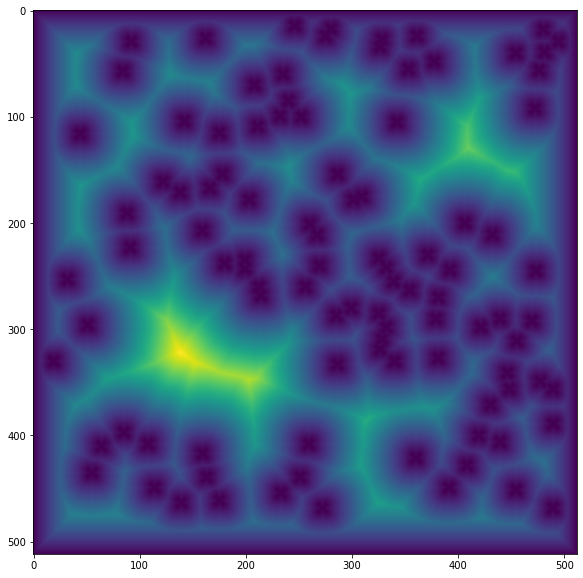

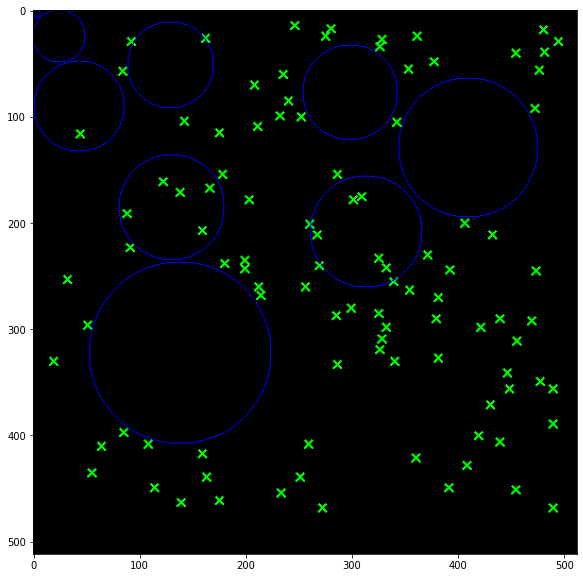

In [218]:
import cv2
from scipy.spatial import distance as dist
#img = cv.imread("/mnt/d/Biometrics Project/python/open_fields_examples/f0010_01_min.bmp")
img = im_th_1.copy()
gray = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)

# threshold to binary and invert so background is white and xxx are black
thresh = cv2.threshold(gray, 128, 255, cv2.THRESH_BINARY)[1]
thresh = 255 - thresh

# add black border around threshold image to avoid corner being largest distance
thresh2 = cv2.copyMakeBorder(thresh, 1,1,1,1, cv2.BORDER_CONSTANT, (0))
h, w = thresh2.shape

# create zeros mask 2 pixels larger in each dimension
mask = np.zeros([h + 2, w + 2], np.uint8)

# apply distance transform
distimg = thresh2.copy()
distimg = cv2.distanceTransform(distimg, cv2.DIST_L2, 5)

# remove excess border
distimg = distimg[1:h-1, 1:w-1]

distimg_1 = distimg.copy()

# get max value and location in distance image
min_val, max_val, min_loc, max_loc = cv2.minMaxLoc(distimg_1)


# scale distance image for viewing
distimg = skimage.exposure.rescale_intensity(distimg, in_range='image', out_range=(0,255))
distimg = distimg.astype(np.uint8)


# draw circle on input
result = img.copy()

centx = max_loc[0]
centy = max_loc[1]
radius = int(max_val)
cv2.circle(result, (centx, centy), radius, (0,0,255), 1)
print('center x,y:', max_loc,'center radius:', max_val)

list_of_circles= []
list_of_circles.append((max_loc[0], max_loc[1], radius))
adder = True
count = 0
while(count < 20):
    if max_loc[1]!=-1:
        distimg_1 = np.delete(distimg_1, max_loc[1], 0)
    min_val, max_val, min_loc, max_loc = cv2.minMaxLoc(distimg_1)
    adder = True
    for val in list_of_circles: # modifying list when using?
        # check if new point is far away from all older 
        # circles centres and distances)
        if dist.euclidean((max_loc[0],max_loc[1]),(val[0], val[1])) < (val[2]+max_val):
            print(max_loc, ' not far from ', val)
            adder = False
            break
    if(adder):
        centx = max_loc[0]
        centy = max_loc[1]
        radius = int(max_val)
        list_of_circles.append((max_loc[0], max_loc[1], radius))
        print(max_loc, ' far ', list_of_circles)
        cv2.circle(result, (centx, centy), radius, (0,0,255), 1)
        count+=1
        print('center x,y:', max_loc,'center radius:', max_val)
        




# distimg_1 = np.delete(distimg_1, 322, 0)
# min_val, max_val, min_loc, max_loc = cv2.minMaxLoc(distimg_1)
# centx = max_loc[0]
# centy = max_loc[1]
# radius = int(max_val)
# cv2.circle(result, (centx, centy), radius, (0,0,255), 1)
# print('center x,y:', max_loc,'center radius:', max_val)
# for i, v in enumerate(distimg_1):
#     print(i, v)






# save image
#cv2.imwrite('xxx_distance.png',distimg)
#cv2.imwrite('xxx_radius.png',result)

# show the images
# cv2.imshow("thresh", thresh)
# cv2.imshow("thresh2", thresh2)
# cv2.imshow("distance", distimg)
# cv2.imshow("result", result)

# plt.imshow(thresh)
# plt.show()
# plt.imshow(thresh2)
# plt.show()
plt.imshow(distimg)
plt.show()
plt.imshow(result)

plt.show()

In [20]:
ret, binary = cv.threshold(gray, 0, 255, 
                cv.THRESH_BINARY_INV | cv.THRESH_TRIANGLE)  # Adaptive Binarization
 
out_binary, contours, hierarchy = cv.findContours(binary, cv.RETR_EXTERNAL, 
                                    cv.CHAIN_APPROX_SIMPLE)

ValueError: not enough values to unpack (expected 3, got 2)